### Decision tree classification

1. Read the data
2. Create Lab Encoder For categorical
3. Split the data into train and test
4. Build a Decision tree with default hyper parameters and check the model performance
5. Try to change the hyper parameter and check the model performance
6. Use Grid search to find the best tuning parameter
7. Visualize the tree structure of the final model
8. Construct a Logistic Regression Model and compare results with Decision Tree

In [246]:
import pandas as pd
from sklearn import tree
from sklearn.metrics import accuracy_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
import numpy as np

#### 1.  Read the data (new_bank.csv)

In [247]:
bank = pd.read_csv("new_bank.csv")
bank.head()

,age,marital,balance,loan,contact,y
0,30,married,1787,no,cellular,no
1,33,married,4789,yes,cellular,no
2,35,single,1350,no,cellular,no
3,30,married,1476,yes,unknown,no
4,59,married,0,no,unknown,no


#### 2. Label Encoding

In [250]:
cat_cols = ['marital','loan','contact','y']

In [1]:
from sklearn.preprocessing import LabelEncoder
for i in range(0,len(bank.columns)):
    j=bank.columns[i]
    if(j in cat_cols):
        le = LabelEncoder()                  # converts the character array to numeric array. Assigns levels to unique labels.
        le.fit(bank[j])
        bank[j] = le.transform(bank[j])
        bank[j]=bank[j].astype('category')

bank.head()

NameError: name 'bank' is not defined

#### Train-Test Split

In [252]:
from sklearn.model_selection import train_test_split

In [253]:
trainx,testx,trainy,testy = train_test_split(bank.iloc[:,:-1],bank.iloc[:,-1],test_size=0.3,random_state=1)
print(bank.shape)
print(trainx.shape)
print(testx.shape)

(4521, 6)
(3164, 5)
(1357, 5)


#### Decsion Tree with Default Parameters

In [254]:
# Defining the model
# Fit / train the model
dtc = tree.DecisionTreeClassifier()
dtc.fit(trainx,trainy)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [255]:
# Get the prediction for both train and test
pred_train = dtc.predict(trainx)
pred_test = dtc.predict(testx)

#### Confusion matrix and Classification Report on Train

In [256]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(trainy,pred_train) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(trainy,pred_train)) 
print('Report : ')
print(classification_report(trainy,pred_train))

Confusion Matrix :
[[2818    0]
 [  16  330]]
Accuracy Score : 0.9949431099873578
Report : 
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2818
           1       1.00      0.95      0.98       346

    accuracy                           0.99      3164
   macro avg       1.00      0.98      0.99      3164
weighted avg       0.99      0.99      0.99      3164



#### Confusion matrix and Classification Report on Test

In [257]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(testy,pred_test) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(testy,pred_test)) 
print('Report : ')
print(classification_report(testy,pred_test))

Confusion Matrix :
[[1054  128]
 [ 150   25]]
Accuracy Score : 0.7951363301400147
Report : 
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      1182
           1       0.16      0.14      0.15       175

    accuracy                           0.80      1357
   macro avg       0.52      0.52      0.52      1357
weighted avg       0.78      0.80      0.79      1357



In [258]:
# !pip install pydotplus

#### Decsion Tree Diagram of Default Parameters Model  

In [120]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Decision Tree Classifier with Hyper parameter of Max_Depth=2

In [260]:
# Defining the model
# Fit / train the model
# Get the prediction for both train and test
# Measure the accuracy of the model for both train and test sets

dtc_2 = tree.DecisionTreeClassifier(max_depth=2)
dtc_2.fit(trainx,trainy)
pred_train_2 = dtc_2.predict(trainx)
pred_test_2 = dtc_2.predict(testx)

#### Confusion matrix and Classification Report on Train

In [261]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(trainy,pred_train_2) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(trainy,pred_train_2)) 
print('Report : ')
print(classification_report(trainy,pred_train_2))

Confusion Matrix :
[[2805   13]
 [ 331   15]]
Accuracy Score : 0.8912768647281921
Report : 
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      2818
           1       0.54      0.04      0.08       346

    accuracy                           0.89      3164
   macro avg       0.72      0.52      0.51      3164
weighted avg       0.86      0.89      0.85      3164



#### Confusion matrix and Classification Report on Test

In [262]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(testy,pred_test_2) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(testy,pred_test_2)) 
print('Report : ')
print(classification_report(testy,pred_test_2))

Confusion Matrix :
[[1177    5]
 [ 171    4]]
Accuracy Score : 0.8703021370670597
Report : 
              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1182
           1       0.44      0.02      0.04       175

    accuracy                           0.87      1357
   macro avg       0.66      0.51      0.49      1357
weighted avg       0.82      0.87      0.82      1357



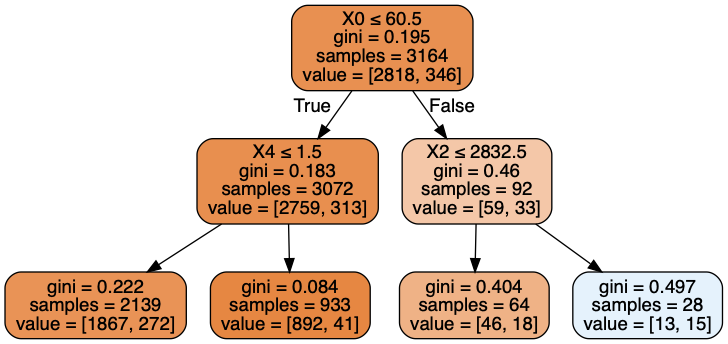

In [263]:
#!pip install pydotplus
# MAC users, use the command -  brew install graphviz
# Windows users need to download msi for webgraphwiz and try the following


from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtc_2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Use Grid search to find the best tuning parameters of Decision Tree

In [264]:
# Define the parameters to be tuned and the ranges that you want to check
# Define the grid search experiemnt
# Fit the grid search on train
# Check the best validation score
# Check the best parameters choosen

parameters={'max_depth':range(1,10)}
clf=GridSearchCV(tree.DecisionTreeClassifier(),param_grid=parameters,n_jobs=-1,cv=10)
clf.fit(trainx,trainy)
print(clf.best_score_)
print(clf.best_params_)

0.890646088727389
{'max_depth': 1}


In [265]:
dtc_3 = clf.best_estimator_
pred_train_3 = dtc_3.predict(trainx)
pred_test_3 = dtc_3.predict(testx)

In [266]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(trainy,pred_train_3) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(trainy,pred_train_3)) 
print('Report : ')
print(classification_report(trainy,pred_train_3))

Confusion Matrix :
[[2818    0]
 [ 346    0]]
Accuracy Score : 0.8906447534766119
Report : 
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      2818
           1       0.00      0.00      0.00       346

    accuracy                           0.89      3164
   macro avg       0.45      0.50      0.47      3164
weighted avg       0.79      0.89      0.84      3164



/Users/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [267]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(testy,pred_test_3) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(testy,pred_test_3)) 
print('Report : ')
print(classification_report(testy,pred_test_3))

Confusion Matrix :
[[1182    0]
 [ 175    0]]
Accuracy Score : 0.871039056742815
Report : 
              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1182
           1       0.00      0.00      0.00       175

    accuracy                           0.87      1357
   macro avg       0.44      0.50      0.47      1357
weighted avg       0.76      0.87      0.81      1357



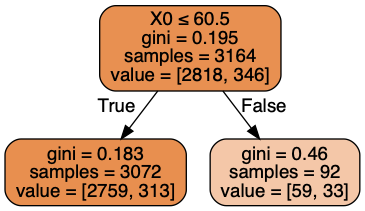

In [268]:
#!pip install pydotplus
# MAC users, use the command -  brew install graphviz
# Windows users need to download msi for webgraphwiz and try the following


from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtc_3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### SMOTING the dataset to reduce the problem of Data-Imbalance

In [269]:
bank.iloc[:,-1].value_counts()

0    4000
1     521
Name: y, dtype: int64

([<matplotlib.axis.XTick at 0x1a501d2828>,
 <a list of 2 Text xticklabel objects>)

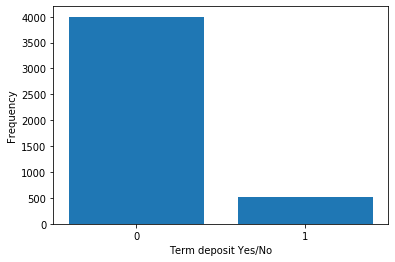

In [270]:
%matplotlib inline
import matplotlib.pyplot as plt
bank.y = bank.y.astype('category')
plt.bar(bank.y.unique(),bank.y.value_counts())
plt.xlabel("Term deposit Yes/No")
plt.ylabel("Frequency")
plt.xticks([0,1])

In [1]:
# !pip install imblearn
from imblearn.over_sampling import RandomOverSampler
smt = RandomOverSampler(random_state=1)
X_train, y_train = smt.fit_sample(bank.iloc[:,:-1],bank.iloc[:,-1])

NameError: name 'bank' is not defined

([<matplotlib.axis.XTick at 0x1a4ffa9b38>,
 <a list of 2 Text xticklabel objects>)

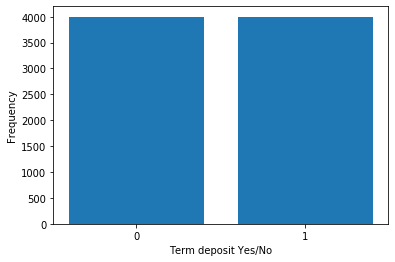

In [272]:
plt.bar(y_train.unique(),y_train.value_counts())
plt.xlabel("Term deposit Yes/No")
plt.ylabel("Frequency")
plt.xticks([0,1])

#### 3. Split the data into train and test

In [197]:
trainx,testx,trainy,testy = train_test_split(X_train, y_train,test_size=0.3,random_state=1)
print(bank.shape)
print(trainx.shape)
print(testx.shape)

(4521, 6)
(5600, 5)
(2400, 5)


#### 4. Build decision tree with default parameters and check the model performance

In [198]:
# Defining the model
# Fit / train the model
dtc = tree.DecisionTreeClassifier()
dtc.fit(trainx,trainy)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [199]:
# Get the prediction for both train and test
pred_train = dtc.predict(trainx)
pred_test = dtc.predict(testx)

In [200]:
# Measure the accuracy of the model for both train and test sets
print("Accuracy on train is:",accuracy_score(trainy,pred_train))
print("Accuracy on test is:",accuracy_score(testy,pred_test))

Accuracy on train is: 0.9916071428571429
Accuracy on test is: 0.9170833333333334


In [201]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(trainy,pred_train) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(trainy,pred_train)) 
print('Report : ')
print(classification_report(trainy,pred_train))

Confusion Matrix :
[[2750   41]
 [   6 2803]]
Accuracy Score : 0.9916071428571429
Report : 
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2791
           1       0.99      1.00      0.99      2809

    accuracy                           0.99      5600
   macro avg       0.99      0.99      0.99      5600
weighted avg       0.99      0.99      0.99      5600



In [202]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(testy,pred_test) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(testy,pred_test)) 
print('Report : ')
print(classification_report(testy,pred_test))

Confusion Matrix :
[[1021  188]
 [  11 1180]]
Accuracy Score : 0.9170833333333334
Report : 
              precision    recall  f1-score   support

           0       0.99      0.84      0.91      1209
           1       0.86      0.99      0.92      1191

    accuracy                           0.92      2400
   macro avg       0.93      0.92      0.92      2400
weighted avg       0.93      0.92      0.92      2400



#### Constructing Decision Tree with Max_Depth=2

In [203]:
# Defining the model
# Fit / train the model
# Get the prediction for both train and test
# Measure the accuracy of the model for both train and test sets

dtc_2 = tree.DecisionTreeClassifier(max_depth=2)
dtc_2.fit(trainx,trainy)
pred_train_2 = dtc_2.predict(trainx)
pred_test_2 = dtc_2.predict(testx)
print("Accuracy on train is:",accuracy_score(trainy,pred_train_2))
print("Accuracy on test is:",accuracy_score(testy,pred_test_2))

Accuracy on train is: 0.59375
Accuracy on test is: 0.6079166666666667


In [204]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(trainy,pred_train_2) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(trainy,pred_train_2)) 
print('Report : ')
print(classification_report(trainy,pred_train_2))

Confusion Matrix :
[[ 836 1955]
 [ 320 2489]]
Accuracy Score : 0.59375
Report : 
              precision    recall  f1-score   support

           0       0.72      0.30      0.42      2791
           1       0.56      0.89      0.69      2809

    accuracy                           0.59      5600
   macro avg       0.64      0.59      0.55      5600
weighted avg       0.64      0.59      0.56      5600



In [205]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(testy,pred_test_2) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(testy,pred_test_2)) 
print('Report : ')
print(classification_report(testy,pred_test_2))

Confusion Matrix :
[[ 397  812]
 [ 129 1062]]
Accuracy Score : 0.6079166666666667
Report : 
              precision    recall  f1-score   support

           0       0.75      0.33      0.46      1209
           1       0.57      0.89      0.69      1191

    accuracy                           0.61      2400
   macro avg       0.66      0.61      0.58      2400
weighted avg       0.66      0.61      0.57      2400



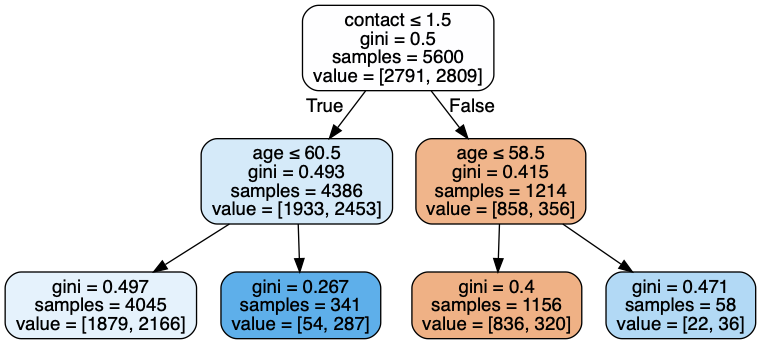

In [206]:
#!pip install pydotplus
# MAC users, use the command -  brew install graphviz
# Windows users need to download msi for webgraphwiz and try the following


from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtc_2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names=trainx.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### 6. Use grid search cv to tune the hyper parameter of the model, get the bset parameters, build the model, and check the performance

In [193]:
type(y_train[0])

numpy.int64

In [214]:
# Define the parameters to be tuned and the ranges that you want to check
# Define the grid search experiemnt
# Fit the grid search on train
# Check the best validation score
# Check the best parameters choosen
from sklearn.metrics import recall_score,f1_score,accuracy_score,precision_score,make_scorer,precision_recall_curve
parameters={'max_depth':range(1,10)}
clf=GridSearchCV(tree.DecisionTreeClassifier(),param_grid=parameters,n_jobs=-1,cv=10,
                scoring=make_scorer(lambda yt,yp: f1_score(yt,yp,pos_label = 1)))
clf.fit(trainx,trainy)
print(clf.best_params_)

{'max_depth': 9}


In [242]:
# Get the best model from cross validation
# Get the predictions for train and test
# Check the model performance

dtc_3 = clf.best_estimator_
pred_train_3 = dtc_3.predict(trainx)
pred_test_3 = dtc_3.predict(testx)
print("Accuracy on train is:",accuracy_score(trainy,pred_train_3))
print("Accuracy on test is:",accuracy_score(testy,pred_test_3))

Accuracy on train is: 0.7278571428571429
Accuracy on test is: 0.6908333333333333


In [243]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(trainy,pred_train_3) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(trainy,pred_train_3)) 
print('Report : ')
print(classification_report(trainy,pred_train_3))

Confusion Matrix :
[[1967  824]
 [ 700 2109]]
Accuracy Score : 0.7278571428571429
Report : 
              precision    recall  f1-score   support

           0       0.74      0.70      0.72      2791
           1       0.72      0.75      0.73      2809

    accuracy                           0.73      5600
   macro avg       0.73      0.73      0.73      5600
weighted avg       0.73      0.73      0.73      5600



In [244]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(testy,pred_test_3) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(testy,pred_test_3)) 
print('Report : ')
print(classification_report(testy,pred_test_3))

Confusion Matrix :
[[801 408]
 [334 857]]
Accuracy Score : 0.6908333333333333
Report : 
              precision    recall  f1-score   support

           0       0.71      0.66      0.68      1209
           1       0.68      0.72      0.70      1191

    accuracy                           0.69      2400
   macro avg       0.69      0.69      0.69      2400
weighted avg       0.69      0.69      0.69      2400



#### 7. Visualize the tree structure of the best tree

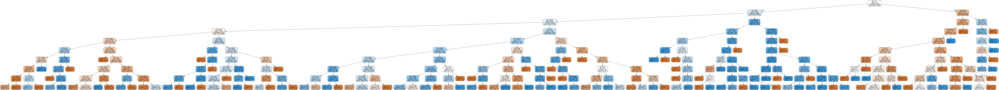

In [245]:
#!pip install pydotplus
# MAC users, use the command -  brew install graphviz
# Windows users need to download msi for webgraphwiz and try the following


from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtc_3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Logistic Regression

In [148]:
from sklearn.linear_model import LogisticRegression
#create an instance and fit the model 
logmodel = LogisticRegression()
logmodel.fit(trainx,trainy)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [149]:
Predict_train = logmodel.predict(trainx)
Predict_test = logmodel.predict(testx)

In [150]:
print("Accuracy on train is:",accuracy_score(trainy,Predict_train))
print("Accuracy on test is:",accuracy_score(testy,Predict_test))

Accuracy on train is: 0.6182142857142857
Accuracy on test is: 0.6295833333333334


In [151]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(trainy,Predict_train) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(trainy,Predict_train)) 
print('Report : ')
print(classification_report(trainy,Predict_train))

Confusion Matrix :
[[1292 1499]
 [ 639 2170]]
Accuracy Score : 0.6182142857142857
Report : 
              precision    recall  f1-score   support

           0       0.67      0.46      0.55      2791
           1       0.59      0.77      0.67      2809

    accuracy                           0.62      5600
   macro avg       0.63      0.62      0.61      5600
weighted avg       0.63      0.62      0.61      5600



In [152]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(testy,Predict_test) 
print('Confusion Matrix :')
print(results) 
print('Accuracy Score :',accuracy_score(testy,Predict_test)) 
print('Report : ')
print(classification_report(testy,Predict_test))

Confusion Matrix :
[[588 621]
 [268 923]]
Accuracy Score : 0.6295833333333334
Report : 
              precision    recall  f1-score   support

           0       0.69      0.49      0.57      1209
           1       0.60      0.77      0.67      1191

    accuracy                           0.63      2400
   macro avg       0.64      0.63      0.62      2400
weighted avg       0.64      0.63      0.62      2400



### Decision tree regression

1. Read the data
2. Create dummies
3. Split the data into train and test
4. Use Grid search to find the best tuning parameter, get the best model and check the model performance
5. Visualize the tree structure of the final model

#### 1. Read the data ("new_customer.csv")

In [153]:
customer = pd.read_csv("new_customer.csv")
customer.head()

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,NoOfGamesBought,FavoriteGame,TotalRevenueGenerated
0,1,2,3,8,10,Uniform,107.51
1,1,2,3,6,7,Uniform,382.40
2,1,4,3,5,18,Uniform,135.01
3,1,1,6,6,11,Uniform,125.00
4,1,3,6,9,44,Uniform,335.05


In [154]:
customer['FavoriteGame'].value_counts()

Uniform     3083
Favorite     126
Name: FavoriteGame, dtype: int64

In [155]:
customer.dtypes

City                       int64
NoOfChildren               int64
MinAgeOfChild              int64
MaxAgeOfChild              int64
NoOfGamesBought            int64
FavoriteGame              object
TotalRevenueGenerated    float64
dtype: object

#### 2. Create dummies for the columns ("City","FavoriteGame")

In [156]:
cat_cols = ["FavoriteGame"]

In [157]:
from sklearn.preprocessing import LabelEncoder
for i in range(0,len(customer.columns)):
    j=customer.columns[i]
    if(j in cat_cols):
        le = LabelEncoder()                  # converts the character array to numeric array. Assigns levels to unique labels.
        le.fit(customer[j])
        customer[j] = le.transform(customer[j])
        customer[j]=customer[j].astype('category')

customer.head()

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,NoOfGamesBought,FavoriteGame,TotalRevenueGenerated
0,1,2,3,8,10,1,107.51
1,1,2,3,6,7,1,382.40
2,1,4,3,5,18,1,135.01
3,1,1,6,6,11,1,125.00
4,1,3,6,9,44,1,335.05


#### 3. Split the data into train and test

In [158]:
trainx,testx,trainy,testy = train_test_split(customer2.iloc[:,np.r_[0:4,5,6]],customer2.TotalRevenueGenerated,test_size=0.3,random_state=1)

print(customer.shape)
print(trainx.shape)
print(testx.shape)

(3209, 7)
(2246, 6)
(963, 6)


#### 4. Use grid search cv to tune the hyper parameter of the model, get the bset parameters, build the model, and check the performance

In [159]:
# Define the parameters to be tuned and the ranges that you want to check
# Define the grid search experiemnt
# Fit the grid search on train
# Check the best validation score
# Check the best parameters choosen

parameters={'max_depth':range(1,5)}
clf=GridSearchCV(tree.DecisionTreeRegressor(),param_grid=parameters,n_jobs=-1,cv=10)
clf.fit(trainx,trainy)

print(clf.best_params_)

{'max_depth': 4}


In [160]:
# Get the best model from cross validation
# Get the predictions for train and test
# Check the model performance

dt_reg = clf.best_estimator_
pred_train_reg = dt_reg.predict(trainx)
pred_test_reg = dt_reg.predict(testx)
print("Accuracy on train is:",mean_absolute_error(trainy,pred_train_reg))
print("Accuracy on test is:",mean_absolute_error(testy,pred_test_reg))

Accuracy on train is: 5.0055199946259785
Accuracy on test is: 5.412770070195189


#### 5. Visualize the tree structure of the final model

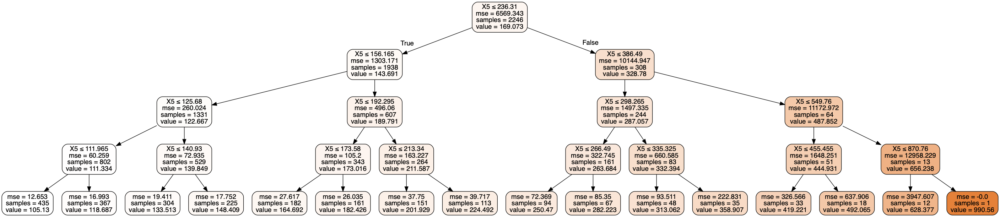

In [161]:
dot_data = StringIO()
export_graphviz(dt_reg, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())